## Predicting Genre of a Song from Lyrics

### Data Pre-Processing

In [2]:
import pandas as pd
import nltk
pd.set_option('display.max_colwidth', -1)

#### Reading Data

In [3]:
lyrics = pd.read_csv("lyrics.csv")
lyrics.head(1)

,index,song,year,artist,genre,lyrics
0,0,ego-remix,2009,beyonce-knowles,Pop,"Oh baby, how you doing?\nYou know I'm gonna cut right to the chase\nSome women were made but me, myself\nI like to think that I was created for a special purpose\nYou know, what's more special than you? You feel me\nIt's on baby, let's get lost\nYou don't need to call into work 'cause you're the boss\nFor real, want you to show me how you feel\nI consider myself lucky, that's a big deal\nWhy? Well, you got the key to my heart\nBut you ain't gonna need it, I'd rather you open up my body\nAnd show me secrets, you didn't know was inside\nNo need for me to lie\nIt's too big, it's too wide\nIt's too strong, it won't fit\nIt's too much, it's too tough\nHe talk like this 'cause he can back it up\nHe got a big ego, such a huge ego\nI love his big ego, it's too much\nHe walk like this 'cause he can back it up\nUsually I'm humble, right now I don't choose\nYou can leave with me or you could have the blues\nSome call it arrogant, I call it confident\nYou decide when you find on what I'm working with\nDamn I know I'm killing you with them legs\nBetter yet them thighs\nMatter a fact it's my smile or maybe my eyes\nBoy you a site to see, kind of something like me\nIt's too big, it's too wide\nIt's too strong, it won't fit\nIt's too much, it's too tough\nI talk like this 'cause I can back it up\nI got a big ego, such a huge ego\nBut he love my big ego, it's too much\nI walk like this 'cause I can back it up\nI, I walk like this 'cause I can back it up\nI, I talk like this 'cause I can back it up\nI, I can back it up, I can back it up\nI walk like this 'cause I can back it up\nIt's too big, it's too wide\nIt's too strong, it won't fit\nIt's too much, it's too tough\nHe talk like this 'cause he can back it up\nHe got a big ego, such a huge ego, such a huge ego\nI love his big ego, it's too much\nHe walk like this 'cause he can back it up\nEgo so big, you must admit\nI got every reason to feel like I'm that bitch\nEgo so strong, if you ain't know\nI don't need no beat, I can sing it with piano"


#### Drop the null values

In [4]:
lyrics=lyrics.dropna()
lyrics.isnull().sum()

index     0
song      0
year      0
artist    0
genre     0
lyrics    0
dtype: int64

#### Dropping unnecessary columns

In [5]:
lyrics = lyrics.drop(["index","song","year","artist"],axis=1)

#### Changing into Lower case

In [6]:
lyrics.lyrics = lyrics.lyrics.apply(lambda x: x.lower())


#### Remove punctuation and other unnecessary words 

In [7]:
import re

lyrics.loc[:,"lyrics"] = lyrics.lyrics.apply(lambda x : re.sub("[^\w\s']", ' ', x))
lyrics.loc[:,"lyrics"] = lyrics.lyrics.apply(lambda x : re.sub("\n", ' ', x))
lyrics.loc[:,"lyrics"] = lyrics.lyrics.apply(lambda x : x.replace("chorus",""))
lyrics.loc[:,"lyrics"] = lyrics.lyrics.apply(lambda x : x.replace("verse",""))
lyrics.loc[:,"lyrics"] = lyrics.lyrics.apply(lambda x : re.sub('x\d', ' ', x))
lyrics.loc[:,"lyrics"] = lyrics.lyrics.apply(lambda x : re.sub('\d', ' ', x))

#### Removing lyrics with less than 10 words

In [8]:
new_lyrics = lyrics.copy()
for row in range(0,lyrics.shape[0]):
        if len(lyrics.iloc[row,1].split())<10:
            new_lyrics=new_lyrics.drop(lyrics.index[row])
print("Rows with lyrics less than 10 words : ",(len(lyrics)-len(new_lyrics)))
lyrics=new_lyrics.copy()

Rows with lyrics less than 10 words :  6176


#### Remove non English lyrics

In [9]:
from langdetect import detect
new_lyrics = lyrics.copy()

for row in range(0,lyrics.shape[0]):
    try:
        if detect(lyrics.iloc[row,1])!='en':
            new_lyrics=new_lyrics.drop(lyrics.index[row])
            #print(row)
    except:
        new_lyrics=new_lyrics.drop(lyrics.index[row])

print("Rows with non English lyrics : ",(len(lyrics)-len(new_lyrics)))
lyrics=new_lyrics.copy()

Rows with non English lyrics :  23185


#### Sampling the Data

In [10]:
lyrics = lyrics[lyrics.genre != "Other"]
lyrics = lyrics[lyrics.genre != "Not Available"]
lyrics = lyrics[lyrics.genre != "R&B"]
lyrics = lyrics[lyrics.genre != "Indie"]
lyrics = lyrics[lyrics.genre != "Folk"]
lyrics = lyrics[lyrics.genre != "Jazz"]
lyrics = lyrics[lyrics.genre != "Electronic"]
lyrics["genre"].value_counts()

Rock       100242
Pop        34663 
Hip-Hop    22976 
Metal      21278 
Country    14230 
Name: genre, dtype: int64

In [11]:
lyrics=lyrics.groupby('genre',as_index = False,group_keys=False).apply(lambda s: s.sample(14000,replace=True))

#### Expanding contractions 

In [12]:
import contractions
lyrics.lyrics = lyrics.lyrics.apply(lambda x:contractions.fix(x))

#### Remove Stopwords

In [13]:
from stop_words import get_stop_words
stop_words = get_stop_words('en')

def remove_stopWords(s):
    '''For removing stop words
    '''
    s = ' '.join(word for word in s.split() if word not in stop_words)
    return s

lyrics.loc[:,"lyrics"] = lyrics.lyrics.apply(lambda x: remove_stopWords(x))

#### Lemmatizing the words

In [17]:
from nltk.stem import WordNetLemmatizer 
from nltk.tokenize import word_tokenize

lemmatizer = WordNetLemmatizer() 

def lemmatizeSentence(sentence):
    token_words=word_tokenize(sentence['lyrics'])
    token_words
    lemmatized_sentence=[]
    for word in token_words:
        lemmatized_sentence.append(lemmatizer.lemmatize(word))
        lemmatized_sentence.append(" ")
    return "".join(lemmatized_sentence)

lyrics['lemmatized_words'] = lyrics.apply(lemmatizeSentence, axis=1)
lemmatized_lyrics = lyrics.drop(["lyrics"],axis=1)

### Visualization

In [18]:
Pop_df=lemmatized_lyrics.loc[lemmatized_lyrics['genre']=="Pop"]
Metal_df=lemmatized_lyrics.loc[lemmatized_lyrics['genre']=="Metal"]
Country_df=lemmatized_lyrics.loc[lemmatized_lyrics['genre']=="Country"]
HipHop_df=lemmatized_lyrics.loc[lemmatized_lyrics['genre']=="Hip-Hop"]
Rock_df=lemmatized_lyrics.loc[lemmatized_lyrics['genre']=="Rock"]

#### Wordcloud for Pop genre

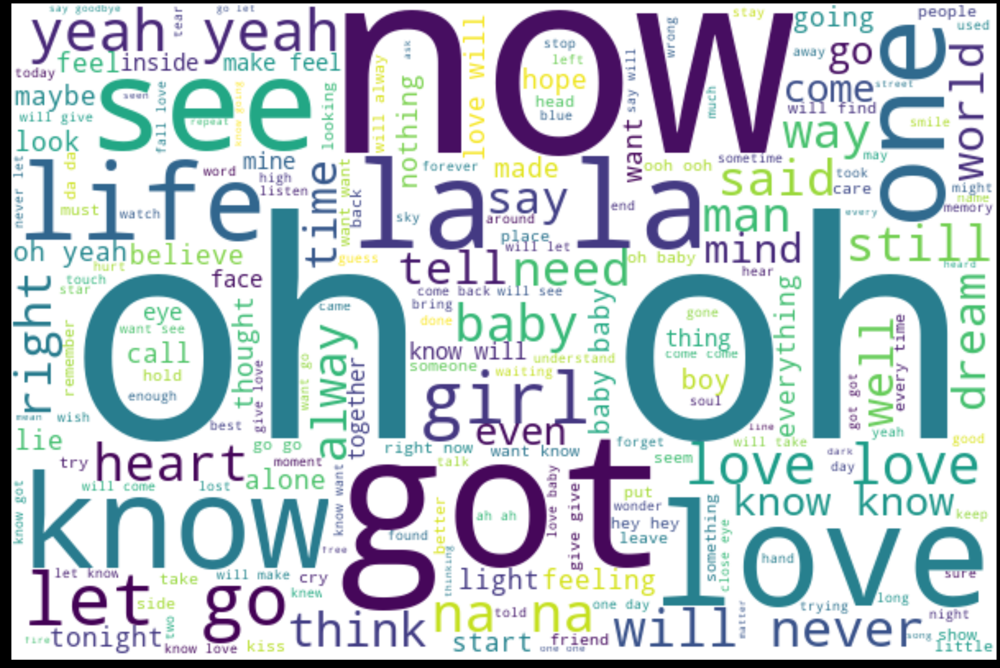

In [19]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

wordcloud = WordCloud( width = 600,height = 400,background_color = 'white').generate(' '.join(Pop_df['lemmatized_words']))


fig = plt.figure(
    figsize = (40, 30),
    facecolor = 'k',
    edgecolor = 'k')

plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

#### Wordcloud for Metal genre

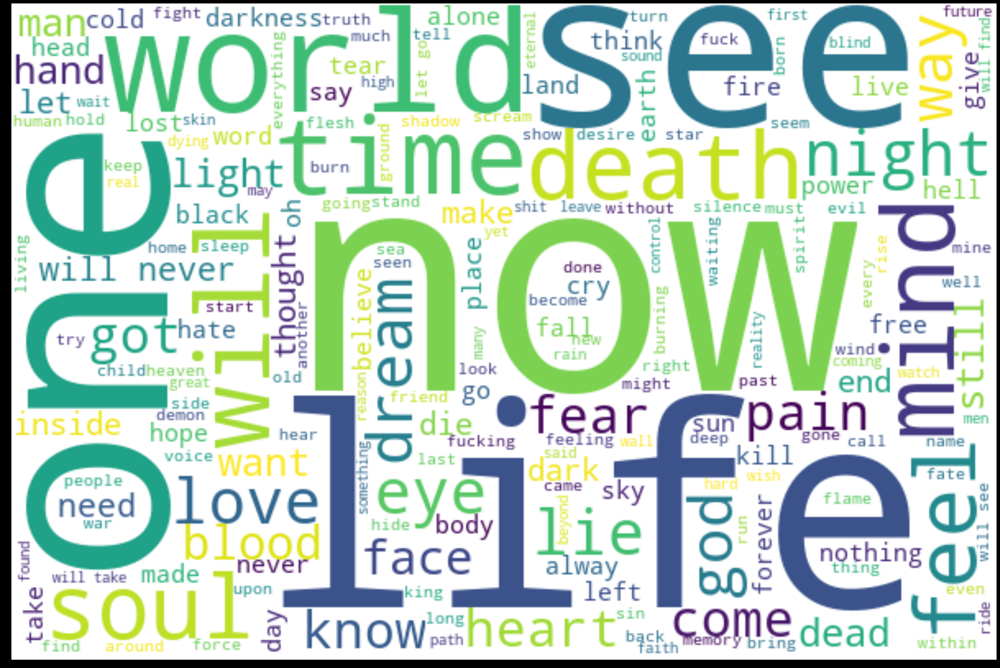

In [20]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

wordcloud2 = WordCloud( width = 600,height = 400,background_color = 'white').generate(' '.join(Metal_df['lemmatized_words']))


fig = plt.figure(
    figsize = (40, 30),
    facecolor = 'k',
    edgecolor = 'k')

plt.imshow(wordcloud2, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

#### Wordcloud for Country genre

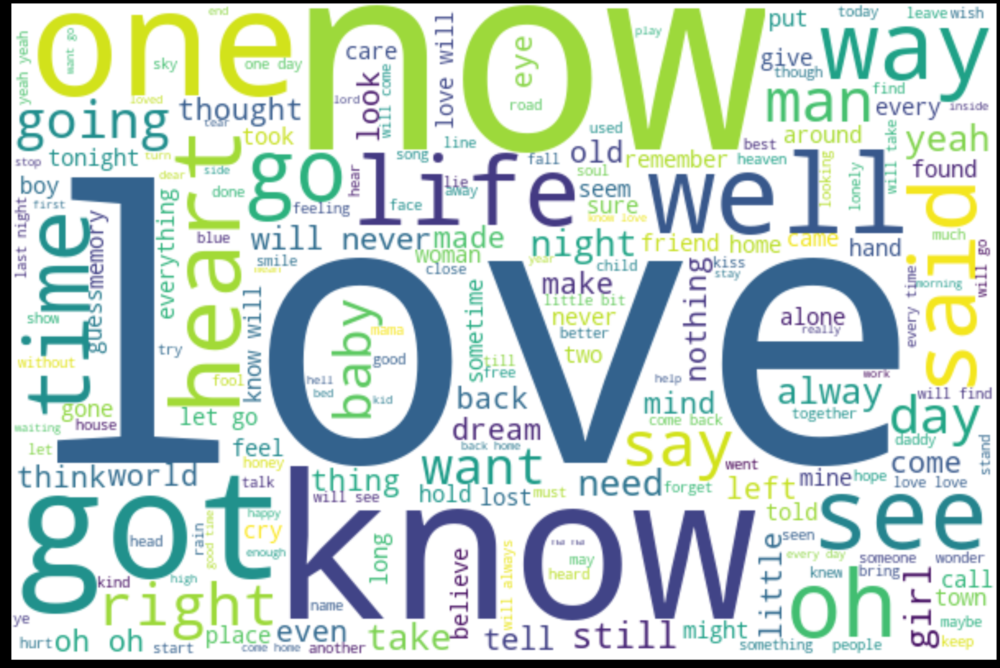

In [21]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

wordcloud = WordCloud( width = 600,height = 400,background_color = 'white').generate(' '.join(Country_df['lemmatized_words']))


fig = plt.figure(
    figsize = (40, 30),
    facecolor = 'k',
    edgecolor = 'k')

plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

#### Wordcloud for Hip-Hop genre

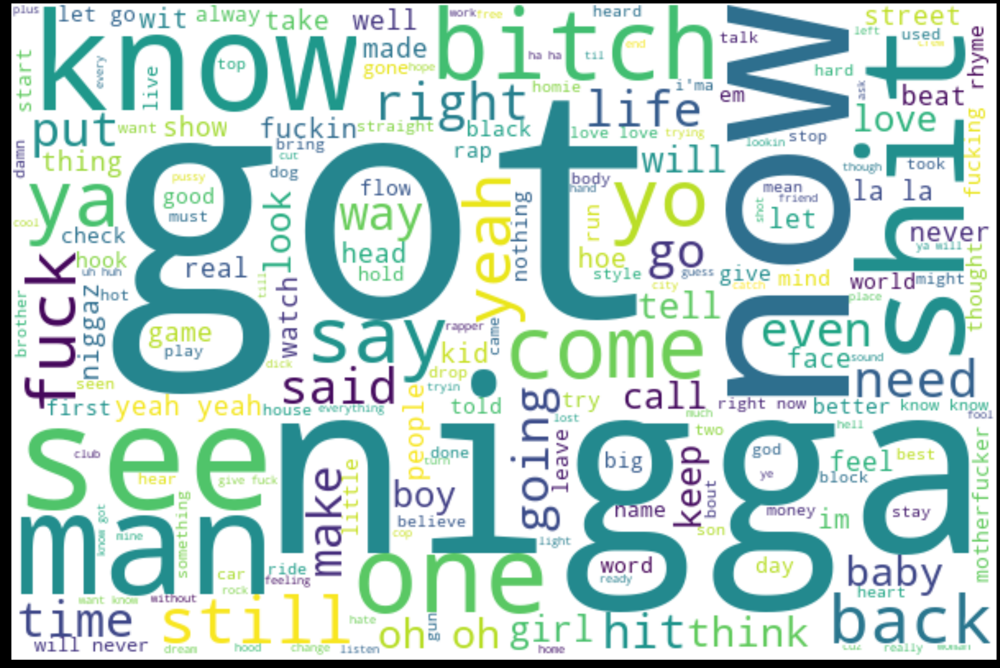

In [22]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

wordcloud = WordCloud( width = 600,height = 400,background_color = 'white').generate(' '.join(HipHop_df['lemmatized_words']))


fig = plt.figure(
    figsize = (40, 30),
    facecolor = 'k',
    edgecolor = 'k')

plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

#### Wordcloud for Rock genre

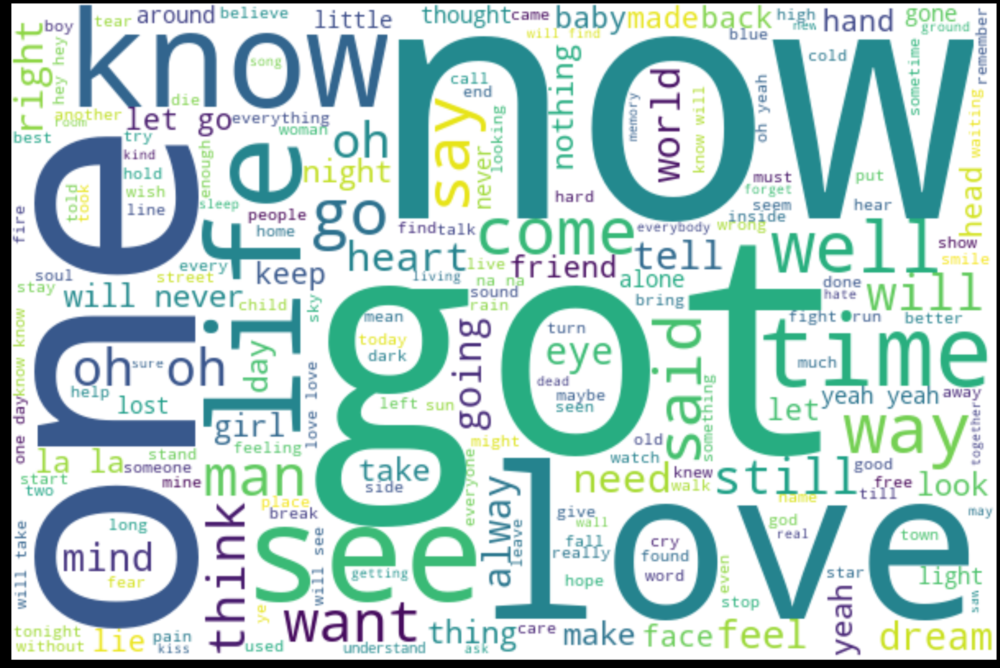

In [23]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

wordcloud = WordCloud( width = 600,height = 400,background_color = 'white').generate(' '.join(Rock_df['lemmatized_words']))


fig = plt.figure(
    figsize = (40, 30),
    facecolor = 'k',
    edgecolor = 'k')

plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

### Splitting the Dataset into Train and Test Dataset

In [24]:
import numpy as np
from sklearn.model_selection import train_test_split

lemmatized_array = lemmatized_lyrics.as_matrix()
X = lemmatized_array[:,1]
Y = lemmatized_array[:,0]

X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.3, random_state=42)

/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:4: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  after removing the cwd from sys.path.


### Multinomial Naive Bayes Classification

In [25]:
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfTransformer
from sklearn.naive_bayes import MultinomialNB
from sklearn.pipeline import Pipeline

text_clf = Pipeline([('vect', CountVectorizer(stop_words='english')),
 ('tfidf', TfidfTransformer()),
 ('clf', MultinomialNB()),
])
text_clf = text_clf.fit(X_train,Y_train)

pred_MB = text_clf.predict(X_test)

MNB_Accuracy = (np.mean(pred_MB == Y_test))*100
print("The accuracy for Multinomial Naive Bayes Classifier is : ",MNB_Accuracy)

The accuracy for Multinomial Naive Bayes Classifier is :  64.07619047619048


### Linear Support Vector Machine

In [26]:
from sklearn import svm

SVM = Pipeline([('vect', CountVectorizer()),
                ('tfidf', TfidfTransformer()),
                ('clf', svm.SVC(C=1.0, kernel='linear', degree=3, gamma='auto')),
               ])

SVM.fit(X_train,Y_train)

pred_SVM = SVM.predict(X_test)

LSV_Accuracy = (np.mean(pred_SVM == Y_test))*100
print("The accuracy for Linear SVM is : ",LSV_Accuracy)

The accuracy for Linear SVM is :  67.39047619047619


### Random Forest

In [27]:
from sklearn.ensemble import RandomForestClassifier

RFclassifier = Pipeline([('vect', CountVectorizer()),
                ('tfidf', TfidfTransformer()),
                ('clf', RandomForestClassifier(n_estimators = 10, criterion = 'entropy', random_state = 42)),
                ])

RFclassifier.fit(X_train,Y_train)

pred_RF = RFclassifier.predict(X_test)

RF_Accuracy = (np.mean(pred_RF == Y_test))*100
print("The accuracy for Random Forest Classifier is : ",RF_Accuracy)

/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/weight_boosting.py:29: DeprecationWarning: numpy.core.umath_tests is an internal NumPy module and should not be imported. It will be removed in a future NumPy release.
  from numpy.core.umath_tests import inner1d


The accuracy for Random Forest Classifier is :  65.22380952380954


## Classification Report

In [28]:
from sklearn.metrics import classification_report

target_names=["Rock","Pop","Hip-Hop","Metal","Country"]

print("The classification report for Multinomial Naive Bayes Classifier is as followed:\n\n",
      classification_report(Y_test, pred_MB, target_names=target_names))

The classification report for Multinomial Naive Bayes Classifier is as followed:

              precision    recall  f1-score   support

       Rock       0.62      0.78      0.69      4125
        Pop       0.71      0.86      0.78      4192
    Hip-Hop       0.75      0.77      0.76      4303
      Metal       0.54      0.51      0.52      4174
    Country       0.51      0.29      0.37      4206

avg / total       0.63      0.64      0.62     21000



In [29]:
print("The classification report for Linear SVM is as followed:\n\n",
      classification_report(Y_test, pred_SVM, target_names=target_names))

The classification report for Linear SVM is as followed:

              precision    recall  f1-score   support

       Rock       0.69      0.75      0.72      4125
        Pop       0.89      0.82      0.85      4192
    Hip-Hop       0.79      0.78      0.79      4303
      Metal       0.53      0.57      0.55      4174
    Country       0.49      0.45      0.47      4206

avg / total       0.68      0.67      0.67     21000



In [30]:
print("The classification report for Random Forest Classifier is as followed:\n\n",
      classification_report(Y_test, pred_RF, target_names=target_names))

The classification report for Random Forest Classifier is as followed:

              precision    recall  f1-score   support

       Rock       0.61      0.75      0.67      4125
        Pop       0.85      0.86      0.86      4192
    Hip-Hop       0.73      0.76      0.74      4303
      Metal       0.55      0.53      0.54      4174
    Country       0.48      0.36      0.41      4206

avg / total       0.64      0.65      0.64     21000



### Predicting Genre of a Song

In [58]:
from __future__ import print_function
from ipywidgets import interact, interactive, fixed, interact_manual, Layout
import ipywidgets as widgets

def lemmatize_sent(sentence):
    token_words=word_tokenize(sentence)
    token_words
    lemmatized_sentence=[]
    for word in token_words:
        lemmatized_sentence.append(lemmatizer.lemmatize(word))
        lemmatized_sentence.append(" ")
    return "".join(lemmatized_sentence)
inText = widgets.Text(layout=Layout(width='70%'))
outText = widgets.Text()

def data_clean(sender):
    outText.value = inText.value.lower()
    outText.value = re.sub("[^\w\s']", ' ', outText.value)
    outText.value = re.sub("\n", ' ', outText.value)
    outText.value = outText.value.replace("chorus","")
    outText.value = outText.value.replace("verse","")
    outText.value = re.sub('x\d', ' ', outText.value)
    outText.value = re.sub('\d', ' ', outText.value)
    outText.value = contractions.fix(outText.value)
    outText.value = remove_stopWords(outText.value)
    outText.value = remove_stopWords(outText.value)
    outTe4.2 ERROR ANALYSISxt.value = lemmatize_sent(outText.value)

inText.on_submit(data_clean)


In [59]:
inText

Text(value='', layout=Layout(width='70%'))

#### Text after pre-processing

In [63]:
outText.value

'nice meet show incredible thing magic madness heaven sin saw thought oh god look face look like next mistake love s game want play new money suit tie can read like magazine funny rumor lie know heard hey let u friend dying see one end grab passport hand can make bad guy good weekend going forever going go flame can tell high worth pain got long list ex lover will tell insane know love player love game young reckless will take way far will leave breathless nasty scar got long list ex lover will tell insane got blank space baby will write name cherry lip crystal sky show incredible thing stolen kiss pretty lie king baby queen find want girl month wait worst yet come oh screaming cry perfect storm can make table turn rose garden filled thorn keep second guessing like oh god get drunk jealousy will come back time leave darling nightmare dressed like daydream going forever going go flame can tell high worth pain got long list ex lover will tell insane know love player love game young reckl

In [64]:
X=[outText.value]

predictions = SVM.predict(X)

print(predictions[0])


Pop
